<a href="https://colab.research.google.com/github/Sharik2610/-NETFLIX-MOVIES-AND-TV-SHOWS-CLUSTERING/blob/main/Team_Colab_netflix.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name** -NETFLIX MOVIES AND TV SHOWS CLUSTERING



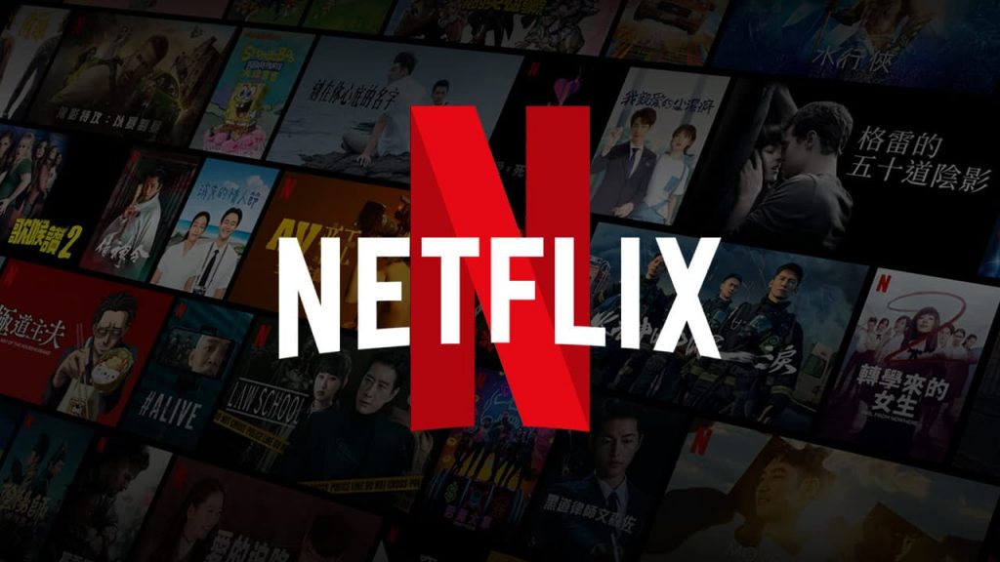

##### **Project Type**    - Unsupervised
##### **Contribution**    - Team

##### **Team Members**        

#### **1.**Sharik Nawaz
#### **2.**Bhupesh Rajput

# **Project Summary -**

The entertainment industry is highly competitive, and success is dependent on various factors, including genre, rating, production budget, cast, and more. In this context, a study was conducted to understand the factors influencing the popularity of movies and TV shows on Netflix. The study used a dataset containing around 12 variables to cluster the movies and TV shows based on their popularity and audience preferences. The first step in the analysis involved data wrangling, where missing values were handled, and unique values were checked. The study identified that there were 2389 missing values for the 'director' column, 718 for the 'cast' column, 507 for the 'country' column, and 10 for the 'date_added' column. These missing values were removed by dropping the corresponding rows.

After understanding the data and getting variables, we first gathered and **cleaned the data, handled the null values** by checking the distribution and outliers in the data after that we have also typecasted the needed features into required format by **type casting** in order to visualize them properly. We performed indepth **EDA** and plotted different types of graphs by separating them into univariate, bivariate and multivariate categories as a result, We came accross some meaningful insights that helped us to make future decisions of ML model pipeline. Then further on, using **feature engineering** and data preprocessing  we have extracted new features like pulse_pressure and glucose_diabetes with the help of some features which are not directly impacting to tenYearCHD. We also tried to get some impacting features by removing **multicollinearity** within the independent variables with the help of **various inflation factor(VIF)**. In this dataset we have not **handled outliers** as removing them could potentially lead to a loss of important information and biased results.

According to the countplot, it appears that Netflix adds the highest number of movies and TV shows during the period between October and January. This period seems to be the busiest time of year for Netflix in terms of adding new content to its platform. Netflix has the highest number of content in the United States, followed by India. India has the highest number of movies on Netflix.

To cluster the shows, the study focused on six key attributes: director, cast, country, genre, rating, and description. These attributes were transformed into a 10,000-feature TFIDF vectorization, and **Principal Component Analysis (PCA)** was used to reduce the components to 3000, capturing more than 80% of the variance. Next, two clustering algorithms, **K-Means and Agglomerative clustering**, were used to group the shows. **K-Means** determined that the optimal number of clusters was 5, while **Agglomerative clustering suggested 7 clusters, which were visualized using a dendrogram**.

Finally, a content-based recommender system was created using the similarity matrix obtained through cosine similarity. This system provides personalized recommendations based on the type of show the user has watched, giving them 10 top-notch suggestions to explore. In summary, the study identified key trends in the Netflix dataset, including the growth rate of movies versus TV shows, the busiest period for adding new content, and the content demographics. Through clustering and a content-based recommender system, the study was able to provide personalized recommendations based on the user's viewing history. This study provides valuable insights into the factors influencing the popularity of movies and TV shows on Netflix, offering a foundation for further research and analysis.

# **Problem Statement**


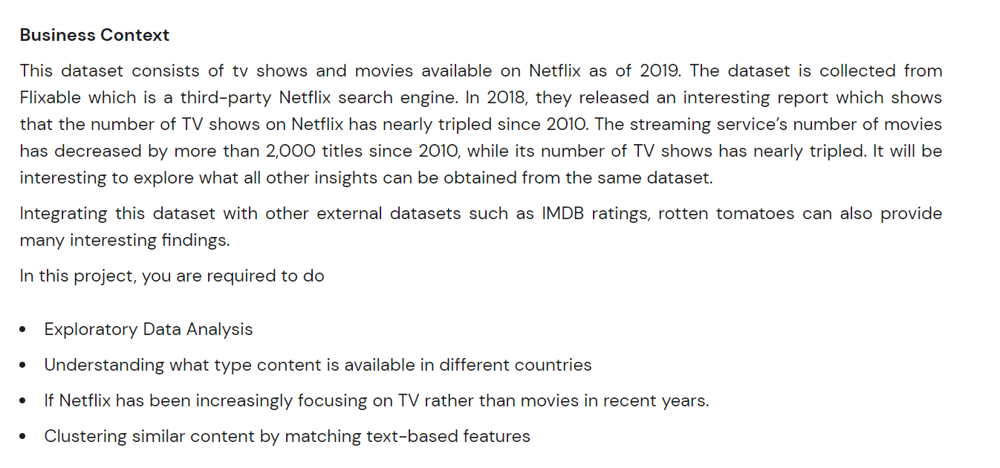

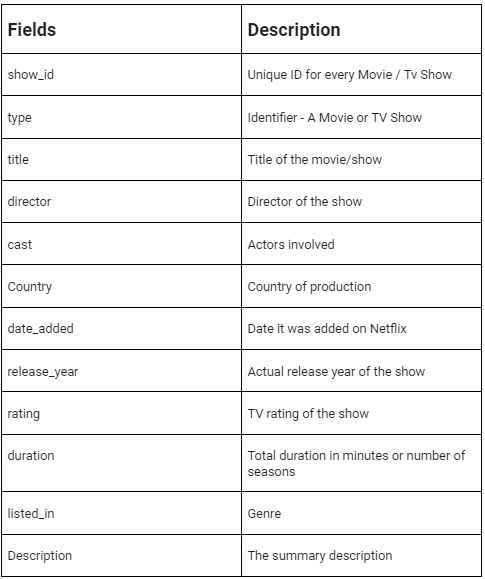

# **GitHub Link -**
https://github.com/Sharik2610/-NETFLIX-MOVIES-AND-TV-SHOWS-CLUSTERING
https://github.com/Bhupesh1111/Unsupervised_ML_project_on_Netflix


# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required.
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits.
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule.

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [ ]:
# Import Libraries
# Importing Numpy & Pandas for data processing & data wrangling
import numpy as np
import pandas as pd


import warnings    # do not disturb mode
warnings.filterwarnings('ignore')

# Importing  tools for visualization
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

# Importing libraries for hypothesis testing
from scipy.stats import uniform
from scipy.stats import norm
from scipy.stats import chi2
from scipy.stats import t
from scipy.stats import f
from scipy.stats import ttest_ind
import scipy.stats as stats

# Word Cloud library
from wordcloud import WordCloud, STOPWORDS

# library used for textual data prerocessing
import string
string.punctuation
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.stem.snowball import SnowballStemmer
from scipy.stats import ttest_ind
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA

# library used for Clusters impelementation
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc

# library used for building recommandation system
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### Dataset Loading

In [ ]:
#mounting drive
from google.colab import drive
drive.mount('/content/drive',force_remount= True)

Mounted at /content/drive


In [ ]:
# Load Dataset
df = pd.read_csv('/content/drive/MyDrive/AlmaBetter/NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv')

### Dataset First View

In [ ]:
# Dataset First Look
df.head(20)

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...
5,s6,TV Show,46,Serdar Akar,"Erdal Beşikçioğlu, Yasemin Allen, Melis Birkan...",Turkey,"July 1, 2017",2016,TV-MA,1 Season,"International TV Shows, TV Dramas, TV Mysteries",A genetics professor experiments with a treatm...
6,s7,Movie,122,Yasir Al Yasiri,"Amina Khalil, Ahmed Dawood, Tarek Lotfy, Ahmed...",Egypt,"June 1, 2020",2019,TV-MA,95 min,"Horror Movies, International Movies","After an awful accident, a couple admitted to ..."
7,s8,Movie,187,Kevin Reynolds,"Samuel L. Jackson, John Heard, Kelly Rowan, Cl...",United States,"November 1, 2019",1997,R,119 min,Dramas,After one of his high school students attacks ...
8,s9,Movie,706,Shravan Kumar,"Divya Dutta, Atul Kulkarni, Mohan Agashe, Anup...",India,"April 1, 2019",2019,TV-14,118 min,"Horror Movies, International Movies","When a doctor goes missing, his psychiatrist w..."
9,s10,Movie,1920,Vikram Bhatt,"Rajneesh Duggal, Adah Sharma, Indraneil Sengup...",India,"December 15, 2017",2008,TV-MA,143 min,"Horror Movies, International Movies, Thrillers",An architect and his wife move into a castle t...


In [ ]:
# It's give total no of rows and column of our data set
print(f'we have total {df.shape[0]} rows and{df.shape[1]} columns.')

we have total 7787 rows and12 columns.


### Dataset Information

In [ ]:
# Dataset Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


#### Duplicate Values

In [ ]:
# Dataset Duplicate Value Count
No_of_duplicate_rows=df[df.duplicated()].shape[0]
print(f'we hve total no {No_of_duplicate_rows} duplicate rows.')

we hve total no 0 duplicate rows.


#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count
# Checking the sum of null values for each column

df.isna().sum()

show_id            0
type               0
title              0
director        2389
cast             718
country          507
date_added        10
release_year       0
rating             7
duration           0
listed_in          0
description        0
dtype: int64

<Axes: >

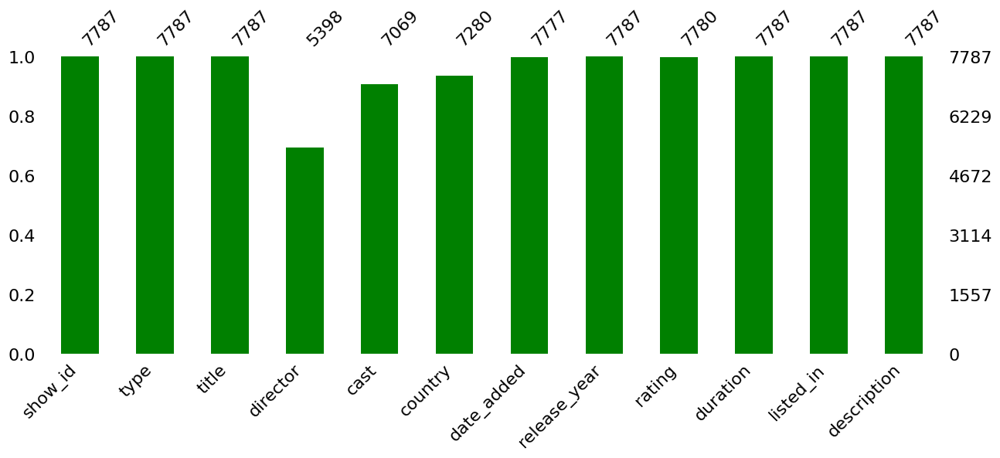

In [ ]:
# Visualizing the missing values
msno.bar(df,figsize=(15,5), color="green")

### What did you know about your dataset?


* We have a dataset that contains Movies/TV shows in Netflix until 2019.
* The dataset has 7787 entries and 12 columns. Out of the 12 columns, 11 are of 'object' datatype and 1 is of 'numeric' datatype.
* There are no duplicate values in the dataset.
* There are five columns containing missing values. There are total 3631 missing values present in the dataset.

## ***2. Understanding Your Variables***

In [ ]:
# Dataset Columns
df.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [ ]:
# Dataset Describe
df.describe()

,release_year,count,kmeans_cluster
count,7770.000000,7770.0,7770.000000
mean,2013.935393,1.0,2.179151
std,8.764357,0.0,1.285514
min,1925.000000,1.0,0.000000
25%,2013.000000,1.0,1.000000
50%,2017.000000,1.0,3.000000
75%,2018.000000,1.0,3.000000
max,2021.000000,1.0,4.000000


### Variables Description



1. *show_id*: Unique ID for every Movie/TV show
2. *type*: A movie or a TV show
3. *title*: Title of the Movie/TV show
4. *director*: Director of the Movie/TV show
5. *cast*: Actors in the movie
6. *country*: Country of produciton
7. *date_added*: Date it was added on Netflix
8. *release_year*: Actual release year of the Movie/TV show
9. *rating*: Movie/TV show rating
10. *duration*: duration in minutes/number of seasons
11. *listed_in*: Genre
12. *Description*: The description summary


### Check Unique Values for each variable.

In [ ]:
# Check Unique Values for each variable.
df.nunique()

show_id         7787
type               2
title           7787
director        4049
cast            6831
country          681
date_added      1565
release_year      73
rating            14
duration         216
listed_in        492
description     7769
dtype: int64

## 3. ***Data Wrangling***

In [ ]:
# imputing with unknown in null values of director and cast feature
df[['director','cast']]=df[['director','cast']].fillna("Unknown")

# Imputing null values of country with Mode
df['country']=df['country'].fillna(df['country'].mode()[0])

# Dropping remaining null values of date_added and rating
df.dropna(axis=0, inplace=True)

In [ ]:
# Rechecking the Missing Values/Null Values Count
df.isna().sum()

show_id         0
type            0
title           0
director        0
cast            0
country         0
date_added      0
release_year    0
rating          0
duration        0
listed_in       0
description     0
dtype: int64

####2.  Handling nested columns i.e 'director', 'cast', 'listed_in' and 'country'

In [ ]:
# Let's create a copy of dataframe and unnest the original one
df_new= df.copy()

In [ ]:
# Unnesting 'director' column
dir_df=df_new['director'].apply(lambda x: str(x).split(', ')).tolist()
df1=pd.DataFrame(dir_df,index=df_new['title'])
df1= df1.stack()
df1=pd.DataFrame(df1.reset_index())
df1=df1.drop(['level_1'],axis=1)
df1.rename(columns={0:"Director"},inplace=True)
df1


,title,Director
0,3%,Unknown
1,7:19,Jorge Michel Grau
2,23:59,Gilbert Chan
3,9,Shane Acker
4,21,Robert Luketic
...,...,...
8482,Zozo,Josef Fares
8483,Zubaan,Mozez Singh
8484,Zulu Man in Japan,Unknown
8485,Zumbo's Just Desserts,Unknown


In [ ]:
# Unnesting 'cast' column
cast_constraint=df_new['cast'].apply(lambda x: str(x).split(', ')).tolist()
df2 = pd.DataFrame(cast_constraint, index = df_new['title'])
df2=df2.stack()
df2 = pd.DataFrame(df2.reset_index())
df2.rename(columns={0:'Actors'},inplace=True)
df2 = df2.drop(['level_1'],axis=1)
df2


,title,Actors
0,3%,João Miguel
1,3%,Bianca Comparato
2,3%,Michel Gomes
3,3%,Rodolfo Valente
4,3%,Vaneza Oliveira
...,...,...
56558,Zubaan,Chittaranjan Tripathy
56559,Zulu Man in Japan,Nasty C
56560,Zumbo's Just Desserts,Adriano Zumbo
56561,Zumbo's Just Desserts,Rachel Khoo


In [ ]:
# Unnesting 'listed_in' column
listed_constraint=df_new['listed_in'].apply(lambda x: str(x).split(', ')).tolist()
df3 = pd.DataFrame(listed_constraint, index = df_new['title'])
df3 = df3.stack()
df3 = pd.DataFrame(df3.reset_index())
df3.rename(columns={0:'Genre'},inplace=True)
df3 = df3.drop(['level_1'],axis=1)
df3.head(10)

,title,Genre
0,3%,International TV Shows
1,3%,TV Dramas
2,3%,TV Sci-Fi & Fantasy
3,7:19,Dramas
4,7:19,International Movies
5,23:59,Horror Movies
6,23:59,International Movies
7,9,Action & Adventure
8,9,Independent Movies
9,9,Sci-Fi & Fantasy


In [ ]:
# Unnesting 'country' column
country_df=df_new['country'].apply(lambda x: str(x).split(', ')).tolist()
df4=pd.DataFrame(country_df,index=df_new['title'])
df4=df4.stack()
df4=pd.DataFrame(df4.reset_index())
df4.rename(columns={0:'country'},inplace=True)
df4= df4.drop(['level_1'],axis=1)
df4.head(10)

,title,country
0,3%,Brazil
1,7:19,Mexico
2,23:59,Singapore
3,9,United States
4,21,United States
5,46,Turkey
6,122,Egypt
7,187,United States
8,706,India
9,1920,India


sucessfully separated the nested columns. Now let's just merge all the created dataframe into the single merged dataframe.

In [ ]:
# Merging director and cast
df5 = df2.merge(df1,on=['title'],how='inner')

# Merging listed_in with merged of (director and cast)
df6 = df5.merge(df3,on=['title'],how='inner')

# Merging country with merged of [listed_in with merged of (director and cast)]
merged_df = df6.merge(df4,on=['title'],how='inner')

# Head of final merged dataframe
merged_df.head()

,title,Actors,Director,Genre,country
0,3%,João Miguel,Unknown,International TV Shows,Brazil
1,3%,João Miguel,Unknown,TV Dramas,Brazil
2,3%,João Miguel,Unknown,TV Sci-Fi & Fantasy,Brazil
3,3%,Bianca Comparato,Unknown,International TV Shows,Brazil
4,3%,Bianca Comparato,Unknown,TV Dramas,Brazil


In [ ]:
# Merging unnested data with the created dataframe in order to make the final dataframe
final_df = merged_df.merge(df[['type', 'title', 'date_added', 'release_year', 'rating', 'duration','description']],on=['title'],how='left')
final_df.head()

,title,Actors,Director,Genre,country,type,date_added,release_year,rating,duration,description
0,3%,João Miguel,Unknown,International TV Shows,Brazil,TV Show,"August 14, 2020",2020,TV-MA,4 Seasons,In a future where the elite inhabit an island ...
1,3%,João Miguel,Unknown,TV Dramas,Brazil,TV Show,"August 14, 2020",2020,TV-MA,4 Seasons,In a future where the elite inhabit an island ...
2,3%,João Miguel,Unknown,TV Sci-Fi & Fantasy,Brazil,TV Show,"August 14, 2020",2020,TV-MA,4 Seasons,In a future where the elite inhabit an island ...
3,3%,Bianca Comparato,Unknown,International TV Shows,Brazil,TV Show,"August 14, 2020",2020,TV-MA,4 Seasons,In a future where the elite inhabit an island ...
4,3%,Bianca Comparato,Unknown,TV Dramas,Brazil,TV Show,"August 14, 2020",2020,TV-MA,4 Seasons,In a future where the elite inhabit an island ...


#### Binning of Rating attribute

In [ ]:
# Binning the values in the rating column
rating_map = {'TV-MA':'Adult Content',
              'R':'Adult Content',
              'PG-13':'Teen Content',
              'TV-14':'Teen Content',
              'TV-PG':'Children Content',
              'NR':'Not Rated',
              'TV-G':'Children Content',
              'TV-Y':'Family-friendly Content',
              'TV-Y7':'Family-friendly Content',
              'PG':'Children Content',
              'G':'Children Content',
              'NC-17':'Adult Content',
              'TV-Y7-FV':'Family-friendly Content',
              'UR':'Not Rated'}

df['rating'].replace(rating_map, inplace = True)
df['rating'].unique()

array(['Adult Content', 'Teen Content', 'Children Content', 'Not Rated',
       'Family-friendly Content'], dtype=object)

In [ ]:
# Checking head after binning
final_df.shape

(175807, 11)

####Type casting Attribute

In [ ]:
# Typecasting duration into integer by removing 'min' and 'season' from the end
final_df['duration']= final_df['duration'].apply(lambda x: int(x.split()[0]))

# Typecasting string object to datetime object of date_added column
final_df['date_added']= pd.to_datetime(final_df['date_added'])

# Extracting date, day, month and year from date_added column
final_df["day_added"]= final_df["date_added"].dt.day
final_df["month_added"]=final_df["date_added"].dt.month
final_df["year_added"]=final_df["date_added"].dt.year

# Dropping date_added
final_df.drop('date_added', axis=1, inplace=True)

In [ ]:
# Spearating the dataframes for further analysis
df_movies= final_df[final_df['type']== 'Movie']
df_tvshows= final_df[final_df['type']== 'TV Show']

# Printing the shape
print(df_movies.shape, df_tvshows.shape)

(126079, 13) (49728, 13)


In [ ]:
final_df

,title,Actors,Director,Genre,country,type,release_year,rating,duration,description,day_added,month_added,year_added
0,3%,João Miguel,Unknown,International TV Shows,Brazil,TV Show,2020,TV-MA,4,In a future where the elite inhabit an island ...,14,8,2020
1,3%,João Miguel,Unknown,TV Dramas,Brazil,TV Show,2020,TV-MA,4,In a future where the elite inhabit an island ...,14,8,2020
2,3%,João Miguel,Unknown,TV Sci-Fi & Fantasy,Brazil,TV Show,2020,TV-MA,4,In a future where the elite inhabit an island ...,14,8,2020
3,3%,Bianca Comparato,Unknown,International TV Shows,Brazil,TV Show,2020,TV-MA,4,In a future where the elite inhabit an island ...,14,8,2020
4,3%,Bianca Comparato,Unknown,TV Dramas,Brazil,TV Show,2020,TV-MA,4,In a future where the elite inhabit an island ...,14,8,2020
...,...,...,...,...,...,...,...,...,...,...,...,...,...
175802,ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS,Unknown,Sam Dunn,Documentaries,Canada,Movie,2019,TV-MA,90,This documentary delves into the mystique behi...,1,3,2020
175803,ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS,Unknown,Sam Dunn,Documentaries,United States,Movie,2019,TV-MA,90,This documentary delves into the mystique behi...,1,3,2020
175804,ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS,Unknown,Sam Dunn,Music & Musicals,United Kingdom,Movie,2019,TV-MA,90,This documentary delves into the mystique behi...,1,3,2020
175805,ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS,Unknown,Sam Dunn,Music & Musicals,Canada,Movie,2019,TV-MA,90,This documentary delves into the mystique behi...,1,3,2020


### What all manipulations have you done and insights you found?


###In this section, we addressed missing values by either imputing them or dropping them for specific features:

###**Imputation:**

###Imputed 'director' and 'cast' with the  value 'Unknown'.
###Imputed 'country' with the mode of the respective column.

###**Unnesting:**

###Extracted individual values from the following features: 'director', 'cast', 'listed_in', and 'country'.
###Created separate DataFrames to store the unnested values for each feature.

###**Merging:**

###Performed a left join to combine the original DataFrame with the unnested DataFrames. This facilitated the isolation of individual values for each feature.
###**Rating Categorization:**

###Observed that the 'rating' column contained various coded categories.
###Created five bins to categorize the ratings:
###Adult: TV-MA, NC-17
###Restricted: R, UR
###Teen: PG-13, TV-14
###All Ages: TV-G, TV-Y, TV-Y7, TV-Y7-FV, PG, G, TV-PG
###Not Rated: NR
###**Data Splitting:**

###Split the DataFrame into two subsets:
###'df_movies' containing only movie records.
###'df_tvshows' containing only TV show records.
###These preprocessing steps provide a structured and cleaned dataset, enabling more focused and meaningful analysis for both movies and TV shows.    

##  **Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables**

### Univariate Analysis

##  What proportion of the overall content on Netflix consists of movies and TV shows?

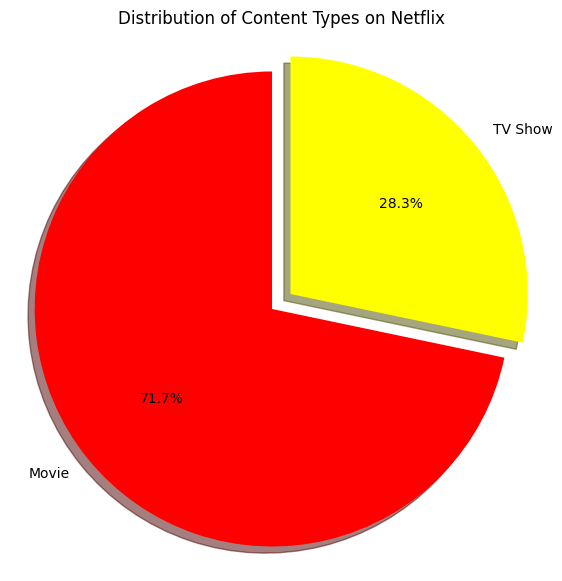

In [ ]:
# Create a DataFrame of the count of each unique value in the 'type' column
type_counts = final_df['type'].value_counts()
plt.figure(figsize=(7,7))
# Create a pie chart of the 'type' column
plt.pie(type_counts, labels=type_counts.index,colors=['#FF0000','#FFFF00'],explode=(0, 0.1),shadow=True, autopct='%1.1f%%',startangle=90)
plt.title('Distribution of Content Types on Netflix')
plt.axis('equal')
plt.show()

##### 1. Why did you pick the specific chart?

Pie charts are one of the best ways for univariate analysis of categorical data.

##### 2. What is/are the insight(s) found from the chart?

Out of 7787 rows in our dataset, we have 69% of them as movies, the rest 31% is TV shows.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The insight that there are more movies on Netflix than TV shows is unlikely to have a significant positive or negative business impact on its own. However, this information could be used in conjunction with other insights and data to inform business decisions.

For example, if Netflix notices that TV shows are more popular with its subscribers than movies, it may decide to focus more on acquiring TV show content. Alternatively, if it sees that its original movie productions are gaining popularity, it may decide to invest more in that area.

## Barplot for Top 10 countries for production

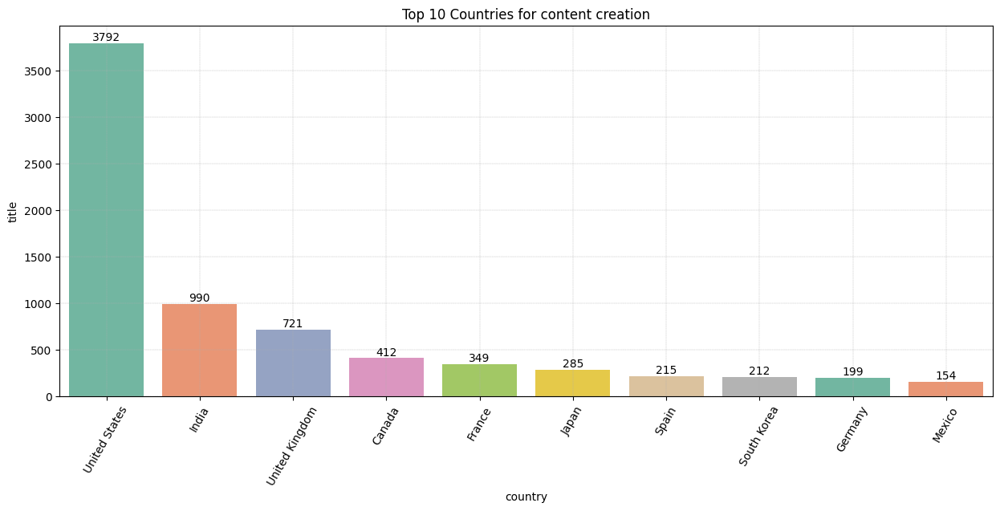

In [ ]:
df_country =final_df.groupby(['country']).agg({'title':'nunique'}).reset_index().sort_values(by=['title'],ascending=False)[:10]
plt.figure(figsize=(15,6))
plots= sns.barplot(x = "country",y = 'title',palette='Set2', data = df_country)
plt.xticks(rotation = 60)
plt.title('Top 10 Countries for content creation')
plt.grid(linestyle='--', linewidth=0.3)
plots.bar_label(plots.containers[0])
plt.show()

##### 1. Why did you pick the specific chart?

As the values in both x & y axes are not in series / continuous, the bar chart is the best option as details are displayed explicitly.

##### 2. What is/are the insight(s) found from the chart?

The US and India are top Movie/TV show producing countries, followed by UK and Japan.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Netflix chooses to produce movies/tv shows in countries that has good viewership potential and great content. The US and India tops these checklists. In addition to this, Netflix can use this data to recommend content based on thier geographic location.

##   Top 10 most popular star of movie and tvshows

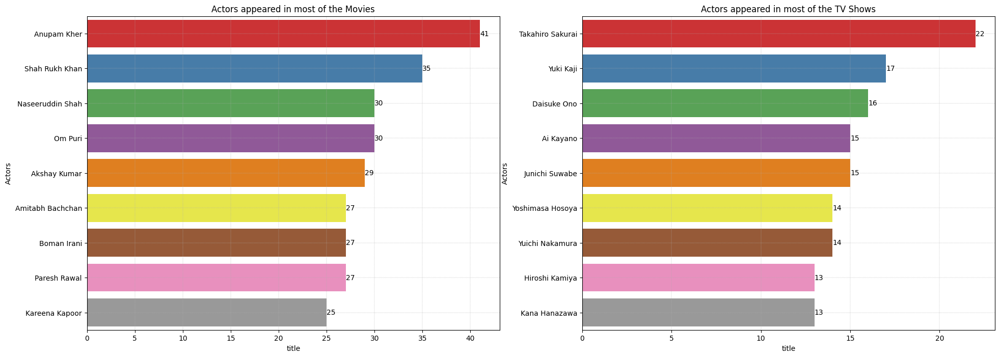

In [ ]:
# Top 10 casts in Movies and TV Shows
plt.style.use('default')
plt.figure(figsize=(23,8))
for i,j,k in ((df_movies, 'Movies',0),(df_tvshows, 'TV Shows',1)):
  plt.subplot(1,2,k+1)
  df_actor = i.groupby(['Actors']).agg({'title':'nunique'}).reset_index().sort_values(by=['title'],ascending=False)[1:10]
  plots= sns.barplot(y = "Actors",x = 'title', data = df_actor, palette='Set1')
  plt.title(f'Actors appeared in most of the {j}')
  plt.grid(linestyle='--', linewidth=0.3)
  plots.bar_label(plots.containers[0])
plt.show()

##### 1. Why did you pick the specific chart?

To know which actors are more popular on Netflix.

##### 2. What is/are the insight(s) found from the chart?

1. We found an interesting insight that **most of the Actors in Movies are from INDIA.**

2. No popular actors from india in TV Shows.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Indians are movie lover, they love to watch movies hence business should target indian audience for Movies.

## Top 10 Generes of Movies

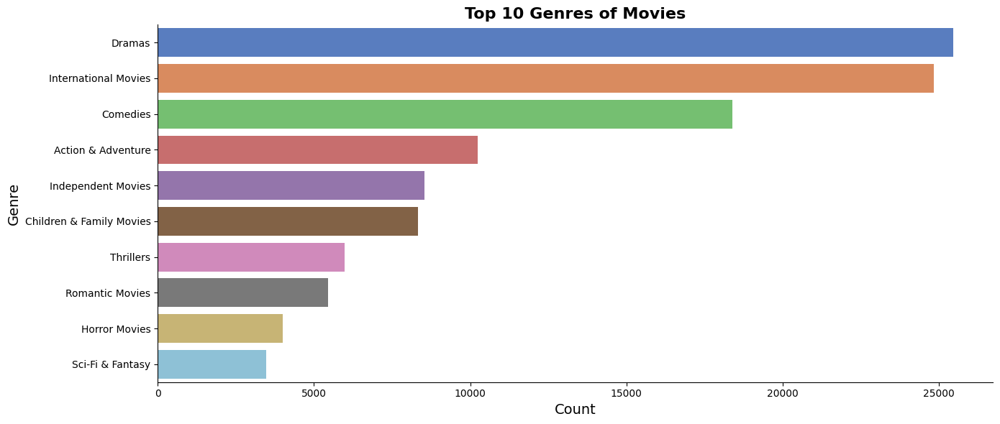

In [ ]:

#Top 10 genres of movies

top10_movies =df_movies['Genre'].value_counts().index[0:10]

#Visualization of code
plt.figure(figsize=(14, 6))
sns.countplot(y='Genre', data=df_movies, order=top10_movies, palette='muted')
plt.title('Top 10 Genres of Movies', fontsize=16, fontweight='bold')
plt.xlabel('Count', fontsize=14)
plt.ylabel('Genre', fontsize=14)
sns.despine()
plt.tight_layout()
plt.show()

## Top 10 Genres of Tv shows

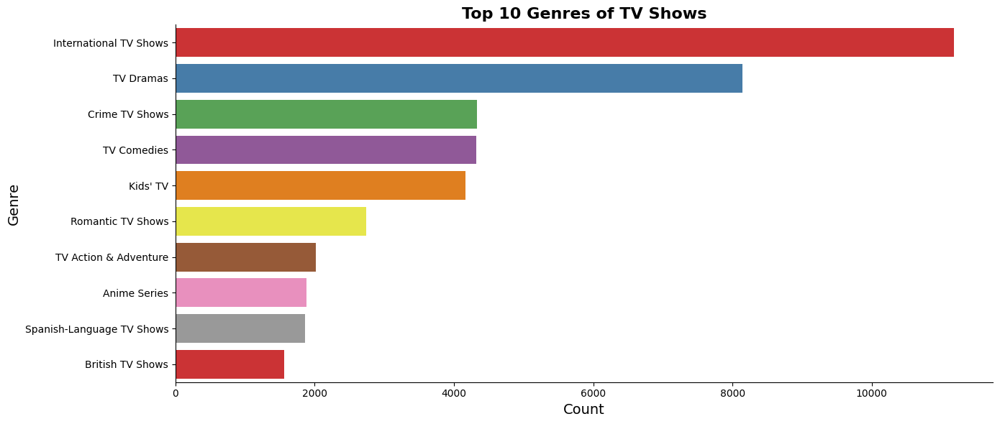

In [ ]:
#Top 10 Genres of Tv shows
top10_tvshows = df_tvshows['Genre'].value_counts().index[0:10]

#Visualization
plt.figure(figsize=(14, 6))
sns.countplot(y='Genre', data=df_tvshows, order=top10_tvshows, palette='Set1')
plt.title('Top 10 Genres of TV Shows', fontsize=16, fontweight='bold')
plt.xlabel('Count', fontsize=14)
plt.ylabel('Genre', fontsize=14)
sns.despine()
plt.tight_layout()
plt.show()

##### 1. Why did you pick the specific chart?

For Movies & TV shows: Countplot is one of the best way to visualize the value count distribution of a categorical variable.

##### 2. What is/are the insight(s) found from the chart?

Netflix offers a diverse range of TV show genres, each with its own unique flavor and appeal. However, one genre that stands out as a perennial favorite among viewers of all ages is kids TV.

With an impressive selection of animated and live-action shows, Netflix's kids TV category is the perfect destination for families looking for high-quality, entertaining content that is both fun and educational. From beloved classics like SpongeBob SquarePants and Power Rangers to exciting new series like Carmen Sandiego and The Dragon Prince, Netflix's kids TV library has something for every young viewer.

Moreover, Netflix's kids TV category is designed with parents in mind, offering a safe and secure viewing environment that allows them to have peace of mind while their kids enjoy their favorite shows. The parental controls feature allows parents to set age-appropriate content filters, monitor viewing history, and restrict access to certain shows or movies.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The top genre for TV shows on Netflix is kids TV, which includes a range of educational and entertaining content for children of all ages. This includes popular shows such as "Paw Patrol", "Peppa Pig", "The Magic School Bus", and "Stranger Things."

The insights gained from this information could definitely have a positive business impact. By knowing which genres are most popular, Netflix can tailor their content offerings and marketing strategies to appeal to their target audience. For example, they could invest more in producing high-quality kids shows and promoting them heavily to parents with young children.

##Total Number of Movies/TV Shows added per month on Netflix.

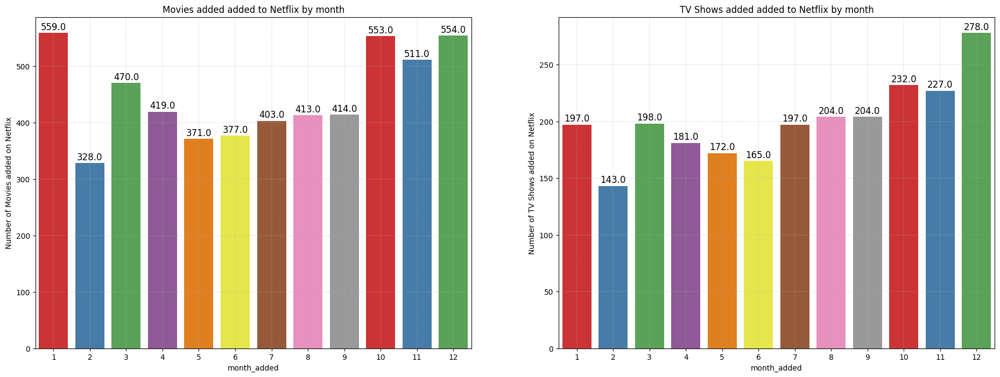

In [ ]:
plt.figure(figsize=(23,8))
for i,j,k in ((df_movies, 'Movies',0),(df_tvshows, 'TV Shows',1)):
  plt.subplot(1,2,k+1)
  df_month = i.groupby(['month_added']).agg({'title':'nunique'}).reset_index().sort_values(by=['month_added'],ascending=False)
  plots= sns.barplot(x = 'month_added',y='title', data = df_month, palette='Set1')
  plt.title(f'{j} added added to Netflix by month')
  plt.ylabel(f"Number of {j} added on Netflix")
  plt.grid(linestyle='--', linewidth=0.3)
  for bar in plots.patches:
     plots.annotate(bar.get_height(),
                    (bar.get_x() + bar.get_width() / 2,
                     bar.get_height()), ha='center', va='center',
                    size=12, xytext=(0, 8),
                    textcoords='offset points')

##### 1. Why did you pick the specific chart?


We have plotted this graph to know in which month the movie/tv shows added is maximum and in which year minimum.



##### 2. What is/are the insight(s) found from the chart?

1.We found that October, November and December are the most popular months for TV shows addition.

2.January, October and November are the most popular months for movie addition.

3.February is the least popular month for the movies and TV shows to be added on Netflix.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The insights gained can help Netflix create a positive business impact by identifying the most popular months for new content additions. This can help Netflix plan content releases during peak periods, leading to increased user engagement and retention.

The insight that February is the least popular month for new content additions could potentially lead to negative growth if Netflix does not maintain a consistent flow of new content during this period. It is important for Netflix to keep its audience engaged throughout the year to avoid dissatisfaction and potential loss of subscribers.

 ##  Distribution of Content Rating in each highest content creating countries

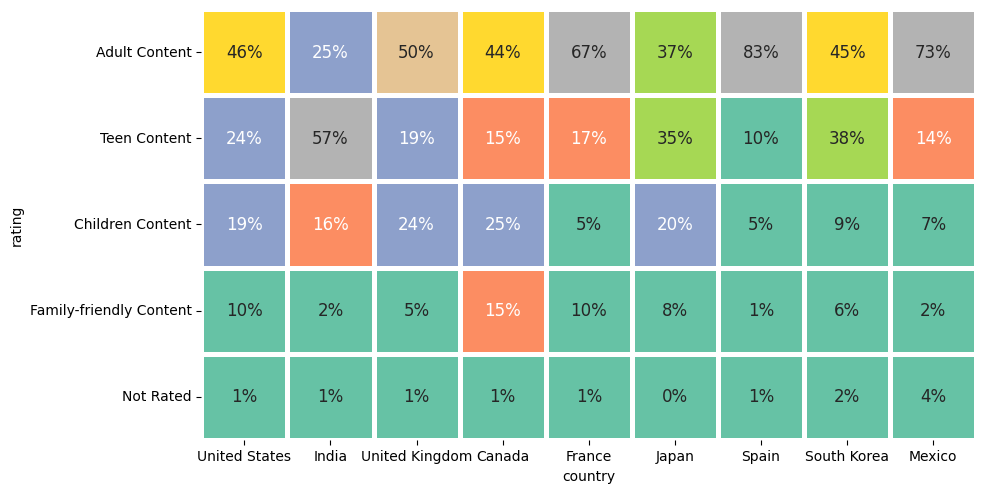

In [ ]:
# Preparing data for heatmap
df['count'] = 1
data = df.groupby('country')[['country','count']].sum().sort_values(by='count',ascending=False).reset_index()[:10]
data = data['country']
df_heatmap = df.loc[df['country'].isin(data)]
df_heatmap = pd.crosstab(df_heatmap['country'],df_heatmap['rating'],normalize = "index").T

# Plotting the heatmap
fig, ax = plt.subplots(1, 1, figsize=(10, 8))

# Defining order of representation
country_order = ['United States','India','United Kingdom','Canada','France','Japan','Spain','South Korea', 'Mexico']
rating_order = ['Adult Content', 'Teen Content', 'Children Content', 'Family-friendly Content', 'Not Rated']

# calling and plotting heatmap
sns.heatmap(df_heatmap.loc[rating_order,country_order], cmap='Set2', square=True,linewidth=2.5,cbar=False,annot=True,fmt='1.0%',vmax=.6,vmin=0.05,ax=ax,annot_kws={"fontsize":12})
plt.show()

##### 1. Why did you pick the specific chart?

This graph shows us which countries producing which type of content the most.

##### 2. What is/are the insight(s) found from the chart?

1. We found that **most of the countries produces content related to Adult and Teen.**

2. Amomg all the countries **INDIA has less content in Adult segment than teen content.**

3. **85% of content is Adult content from spain.**
4. **Canada produces more content related to Children and Family-Friendly content**.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

1. Companies should target the country audience according to there taste of content choice.

2. As in spain Production house should more focus on Adult content.

3. Production house should more focus on children and Family-friendly content for canada because there are chances of Growth.

## ***Hypothesis Testing***

### Based on your chart experiments, define two hypothetical statements from the dataset. In the next two questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.



* Netflix has the highest number of content in the United States, followed by India. India has the highest number of movies on Netflix
* According to the countplot, it appears that Netflix adds the highest number of movies and TV shows during the period between October and January. This period seems to be the busiest time of year for Netflix in terms of adding new content to its platform.



### Hypothetical Statement - 1

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.



Netflix has the highest number of content in the United States, followed by India. India has the highest number of movies on Netflix
*   Null hypothesis H0: The average number of movies on Netflix in the United States is equal to the average number of movies on Netflix in India.

*   Alternate hypothesis Ha: The average number of movies on Netflix in the United States is greater than the average number of movies on Netflix in India.




#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value
# Filter by country
us_movies = df_movies[df_movies.country == 'United States']
india_movies = df_movies[df_movies.country == 'India']

# Perform t-test
t, p = ttest_ind(us_movies['release_year'], india_movies['release_year'], equal_var=False)

# Print the results
alpha = 0.05
if p < alpha:
    print("Reject null hypothesis. The average number of movies on Netflix in the United States is greater than the average number of movies on Netflix in India.")
else:
    print("Fail to reject null hypothesis.")

Reject null hypothesis. The average number of movies on Netflix in the United States is greater than the average number of movies on Netflix in India.


##### Which statistical test have you done to obtain P-Value?

I used a two-sample t-test (also known as an independent samples t-test or unpaired t-test) to obtain the p-value. Specifically, I used the ttest_ind function from the scipy.stats module to perform the t-test. This test is appropriate for comparing the means of two independent samples, which is what we're doing here by comparing the number of movies on Netflix in the United States and India.

##### Why did you choose the specific statistical test?

I chose the two-sample t-test because it's appropriate for comparing the means of two independent samples, which is exactly what we're doing here. We have two independent samples of movies on Netflix in the United States and India, and we want to test whether the mean number of movies in the United States is significantly different from the mean number of movies in India.

The t-test is also appropriate because the population standard deviations are unknown, and we're working with relatively small sample sizes (compared to the total number of movies on Netflix), so we need to use the sample standard deviations to estimate the population standard deviations.

### Hypothetical Statement 2

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

The number of movies on Netflix is greater than the number of TV shows, with 5372 movies and 2398 TV shows currently available on the platform.
*   Null hypothesis H0:  The number of movies and TV shows on Netflix is not significantly different.

*   Alternate hypothesis Ha: The number of movies on Netflix is significantly greater than the number of TV shows.

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value
from statsmodels.stats.proportion import proportions_ztest
# Count the number of movies and TV shows
n_movies = df[df['type'] == 'Movie'].count()['type']
n_tv_shows = df[df['type'] == 'TV Show'].count()['type']

# Set the counts and sample sizes for the z-test
counts = [n_movies, n_tv_shows]
nobs = [len(df), len(df)]

# Perform the z-test assuming equal proportions
z_stat, p_val = proportions_ztest(counts, nobs, value=0, alternative='larger')

# Print the results
print('Number of movies:', n_movies)
print('Number of TV shows:', n_tv_shows)
print('z-statistic:', z_stat)
print('p-value:', p_val)

Number of movies: 5372
Number of TV shows: 2398
z-statistic: 47.71395895355864
p-value: 0.0


##### Which statistical test have you done to obtain P-Value?

I used a two-sample z-test for proportions to obtain the p-value. The null hypothesis for the test is that the proportion of movies and TV shows on Netflix is equal, while the alternative hypothesis is that the proportion of movies is greater than the proportion of TV shows.

##### Why did you choose the specific statistical test?

I chose the two-sample z-test for proportions to compare the number of movies and TV shows on Netflix because the data consists of two categorical variables (movie or TV show), and we want to test if there is a significant difference between the proportions of these categories in the population. The two-sample z-test for proportions is an appropriate test to use when we have two independent samples, and we want to compare the proportion of successes in each sample. In this case, a success refers to a movie or TV show. The test assumes that the samples are large enough to apply the normal approximation to the binomial distribution. Since we have a large sample size in this case, we can use the z-test for proportions to test the hypothesis of interest.

## ***Feature Engineering & Data Pre-processing***

* We have already handled the missing values.
* There's no handling outliers, categorical encoding, feature manipulation, data transformation & data scaling.



In [ ]:
final_df.isna().sum()

title           0
Actors          0
Director        0
Genre           0
country         0
type            0
release_year    0
rating          0
duration        0
description     0
day_added       0
month_added     0
year_added      0
dtype: int64

###  Textual Data Preprocessing
(It's mandatory for textual dataset i.e., NLP, Sentiment Analysis, Text Clustering etc.)

In [ ]:
# creating tags column using all text column which one is used for model building purpose.
df['tags'] = df['description'] + df['listed_in'] + df['rating'] + df['cast'] + df['country']

In [ ]:
df['tags'][0]

'In a future where the elite inhabit an island paradise far from the crowded slums, you get one chance to join the 3% saved from squalor.International TV Shows, TV Dramas, TV Sci-Fi & FantasyAdult ContentJoão Miguel, Bianca Comparato, Michel Gomes, Rodolfo Valente, Vaneza Oliveira, Rafael Lozano, Viviane Porto, Mel Fronckowiak, Sergio Mamberti, Zezé Motta, Celso FrateschiBrazil'

#### Lower Casing & Removing Stopwords & Removing White spaces

In [ ]:
# Lower Casing & Removing Stopwords & Removing White spaces

# download the stop words list if it is not already downloaded
nltk.download('stopwords')

# create a set of English stop words
stop_words = stopwords.words('english')

# displaying stopwords
np.array(stop_words)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


array(['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you',
       "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself',
       'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her',
       'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them',
       'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom',
       'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are',
       'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had',
       'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and',
       'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at',
       'by', 'for', 'with', 'about', 'against', 'between', 'into',
       'through', 'during', 'before', 'after', 'above', 'below', 'to',
       'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under',
       'again', 'further', 'then', 'once', 'here', 'there', 'when',
       'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'm

In [ ]:
def stopwords(text):
    '''a function for removing the stopword and lowercase the each word'''
    text = [word.lower() for word in text.split() if word.lower() not in stop_words]
    # joining the list of words with space separator
    return " ".join(text)

In [ ]:
# applying stopwords function.
df['tags'] = df['tags'].apply(stopwords)

In [ ]:
df.tags[0]

'future elite inhabit island paradise far crowded slums, get one chance join 3% saved squalor.international tv shows, tv dramas, tv sci-fi & fantasyadult contentjoão miguel, bianca comparato, michel gomes, rodolfo valente, vaneza oliveira, rafael lozano, viviane porto, mel fronckowiak, sergio mamberti, zezé motta, celso frateschibrazil'

####Removing Punctuations

In [ ]:
# Remove Punctuations
# function to remove punctuations

def remove_punctuation(text):
    '''a function for removing punctuation'''
    import string
    # replacing the punctuations with no space, which in effect deletes the punctuation marks.
    translator = str.maketrans('', '', string.punctuation)
    # return the text stripped of punctuation marks
    return text.translate(translator)

In [ ]:
# applying remove_punctuation function
df['tags'] = df['tags'].apply(remove_punctuation)

In [ ]:
df.tags[0]

'future elite inhabit island paradise far crowded slums get one chance join 3 saved squalorinternational tv shows tv dramas tv scifi  fantasyadult contentjoão miguel bianca comparato michel gomes rodolfo valente vaneza oliveira rafael lozano viviane porto mel fronckowiak sergio mamberti zezé motta celso frateschibrazil'

####  Stemming

In [ ]:
# Stemming

from nltk.stem.snowball import SnowballStemmer

# create an object of stemming function
stemmer = SnowballStemmer("english")

def stemming(text):
    '''a function which stems each word in the given text'''
    text = [stemmer.stem(word) for word in text.split()]
    return " ".join(text)

In [ ]:
# appying stemming function
df['tags'] = df['tags'].apply(stemming)

In [ ]:
df.tags[0]


'futur elit inhabit island paradis far crowd slum get one chanc join 3 save squalorintern tv show tv drama tv scifi fantasyadult contentjoão miguel bianca comparato michel gome rodolfo valent vaneza oliveira rafael lozano vivian porto mel fronckowiak sergio mamberti zezé motta celso frateschibrazil'

####  Text Vectorization

In [ ]:
# Vectorizing Text
# create the object of tfid vectorizer
tfidf = TfidfVectorizer(stop_words='english', lowercase=False, max_features = 10000)   # max features = 10000 to prevent system from crashing

# fit the vectorizer using the text data
tfidf.fit(df['tags'])

# collect the vocabulary items used in the vectorizer
dictionary = tfidf.vocabulary_.items()

In [ ]:
print(len(dictionary)) #number of independet features created from "tags" columns ---> max_features=10000

10000


In [ ]:
# convert vector into array form for clustering
vector = tfidf.transform(df['tags']).toarray()

# summarize encoded vector
print(vector)
print(f'shape of the vector : {vector.shape}')
print(f'datatype : {type(vector)}')


[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
shape of the vector : (7770, 10000)
datatype : <class 'numpy.ndarray'>


##### Which text vectorization technique have you used and why?

Word/Text vectorization is the process of representing words as numerical vectors. This is important in NLP tasks because most machine learning models expect numerical input and cannot work with raw text data directly. Word vectorization allows you to input the words into a machine learning model in a way that preserve the meaning and context of the words. Word vectorization can also be used to measure the similarity between words using vector arithmetic.

### Dimesionality Reduction

##### Do you think that dimensionality reduction is needed? Explain Why?

In [ ]:
df

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,count,tags
0,s1,TV Show,3%,Unknown,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,Adult Content,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,1,futur elit inhabit island paradis far crowd sl...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,Adult Content,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,1,devast earthquak hit mexico citi trap survivor...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,Adult Content,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",1,armi recruit found dead fellow soldier forc co...
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,Teen Content,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",1,postapocalypt world ragdol robot hide fear dan...
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,Teen Content,123 min,Dramas,A brilliant group of students become card-coun...,1,brilliant group student becom cardcount expert...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7782,s7783,Movie,Zozo,Josef Fares,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...","Sweden, Czech Republic, United Kingdom, Denmar...","October 19, 2020",2005,Adult Content,99 min,"Dramas, International Movies",When Lebanon's Civil War deprives Zozo of his ...,1,lebanon civil war depriv zozo famili hes left ...
7783,s7784,Movie,Zubaan,Mozez Singh,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,"March 2, 2019",2015,Teen Content,111 min,"Dramas, International Movies, Music & Musicals",A scrappy but poor boy worms his way into a ty...,1,scrappi poor boy worm way tycoon dysfunct fami...
7784,s7785,Movie,Zulu Man in Japan,Unknown,Nasty C,United States,"September 25, 2020",2019,Adult Content,44 min,"Documentaries, International Movies, Music & M...","In this documentary, South African rapper Nast...",1,documentari south african rapper nasti c hit s...
7785,s7786,TV Show,Zumbo's Just Desserts,Unknown,"Adriano Zumbo, Rachel Khoo",Australia,"October 31, 2020",2019,Children Content,1 Season,"International TV Shows, Reality TV",Dessert wizard Adriano Zumbo looks for the nex...,1,dessert wizard adriano zumbo look next “willi ...


Yes, as there 14 columns in our dataset, we need to reduce the dimntionality to reduce complexity.

In [ ]:
# DImensionality Reduction (If needed)
# using PCA to reduce dimensionality
pca = PCA(random_state=30)
pca.fit(vector)

PCA(random_state=30)

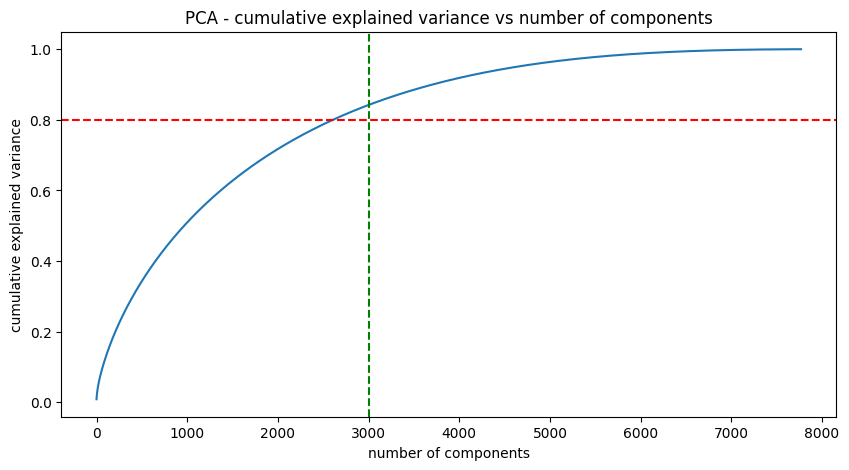

In [ ]:
# Explained variance for different number of components
plt.figure(figsize=(10,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('PCA - cumulative explained variance vs number of components')
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.axhline(y= 0.8, color='red', linestyle='--')
plt.axvline(x= 3000, color='green', linestyle='--')
plt.show()

In [ ]:
# reducing the dimensions to 3000 using pca
pca = PCA(n_components=3000, random_state=30)
pca.fit(vector)

PCA(n_components=3000, random_state=30)

In [ ]:
# transformed features
X = pca.transform(vector)

# shape of transformed vectors
X.shape


(7770, 3000)

##### Which dimensionality reduction technique have you used and why? (If dimensionality reduction done on dataset.)

We can use PCA (Principal component Analysis) to reduce the dimensionality of data.

Dimensionality reduction is the process of reducing the number of features or dimensions in a dataset while preserving as much information as possible. It is a common step in machine learning and data analysis, as high-dimensional datasets can be difficult to work with and can sometimes suffer from the curse of dimensionality.

## ***7. Clusters Implementation***

### Clusters Model - 1 K-Means Clustering

The k-means algorithm works by first selecting k initial "centroids," or cluster centers, at random from the data. Then, it assigns each sample in the dataset to the nearest centroid, based on some distance metric like Euclidean distance. The algorithm then updates the centroids to be the mean of the samples in each cluster. teratively repeats the process of reassigning samples to the nearest centroids and updating the centroids until convergence. Visualizing the elbow curve and Silhouette score to decide on the optimal number of clusters for K-means clustering algorithm

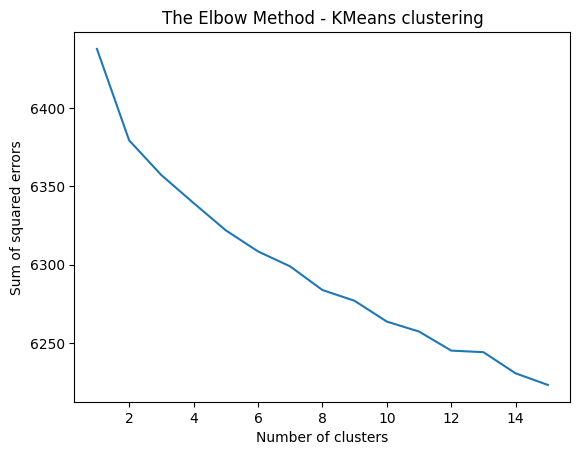

In [ ]:
'''Elbow method to find the optimal value of k'''

# Initialize a list to store the sum of squared errors for each value of k
SSE = []

for k in range(1, 16):
  # Initialize the k-means model with the current value of k
  kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
  # Fit the model to the data
  kmeans.fit(X)
  # Compute the sum of squared errors for the model
  SSE.append(kmeans.inertia_)

# Plot the values of SSE
plt.plot(range(1, 16), SSE)
plt.title('The Elbow Method - KMeans clustering')
plt.xlabel('Number of clusters')
plt.ylabel('Sum of squared errors')
plt.show()

Text(0.5, 1.0, 'Silhouette analysis For Optimal k - KMeans clustering')

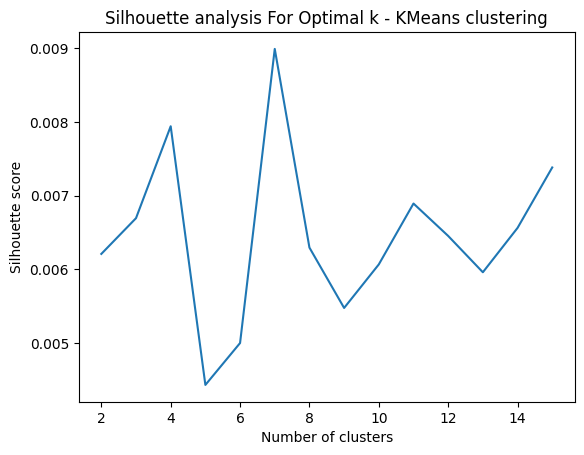

In [ ]:

'''Silhouette score method to find the optimal value of k'''

# Initialize a list to store the silhouette score for each value of k
silhouette_avg = []

for k in range(2, 16):
  # Initialize the k-means model with the current value of k
  kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
  # Fit the model to the data
  kmeans.fit(X)
  # Predict the cluster labels for each point in the data
  labels = kmeans.labels_
  # Compute the silhouette score for the model
  score = silhouette_score(X, labels)
  silhouette_avg.append(score)

# Plot the Silhouette analysis
plt.plot(range(2,16), silhouette_avg)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k - KMeans clustering')

The highest Silhouette score is obtained for 5 clusters.

Building 5 clusters using the k-means clustering algorithm:

In [ ]:
# Clustering the data into 5 clusters
kmeans = KMeans(n_clusters=5, init='k-means++', random_state=33)
kmeans.fit(X)

KMeans(n_clusters=5, random_state=33)

In [ ]:
# Evaluation metrics - distortion, Silhouette score
kmeans_distortion = kmeans.inertia_
kmeans_silhouette_score = silhouette_score(X, kmeans.labels_)

print((kmeans_distortion, kmeans_silhouette_score))

(6320.860338618257, 0.0049852471938333694)


In [ ]:
# Adding a kmeans cluster number attribute
df['kmeans_cluster'] = kmeans.labels_

In [ ]:
df.sample(5)[['type', 'title', 'cast', 'country', 'rating', 'listed_in', 'description', 'kmeans_cluster']]

,type,title,cast,country,rating,listed_in,description,kmeans_cluster
7725,TV Show,You Cannot Hide,"Blanca Soto, Eduardo Noriega, Iván Sánchez, Ma...",Mexico,Adult Content,"Crime TV Shows, International TV Shows, Spanis...",A nurse and her daughter flee her husband’s dr...,4
5376,Movie,Sangam,"Raj Kapoor, Vyjayanthimala, Rajendra Kumar, La...",India,Teen Content,"Classic Movies, Dramas, International Movies",Returning home from war after being assumed de...,3
3091,Movie,Jaal,"Jeetendra, Mithun Chakraborty, Rekha, Mandakin...",India,Teen Content,"Action & Adventure, International Movies",When a mysterious woman hires Shankar to spy o...,3
1825,Movie,Doom: Annihilation,"Amy Manson, Dominic Mafham, Luke Allen-Gale, J...",United States,Adult Content,"Action & Adventure, Horror Movies, Sci-Fi & Fa...",When a swarm of soul-stealing demons invades a...,1
466,Movie,American History X,"Edward Norton, Edward Furlong, Beverly D'Angel...",United States,Adult Content,Dramas,A neo-Nazi gets sent to prison for murder and ...,1


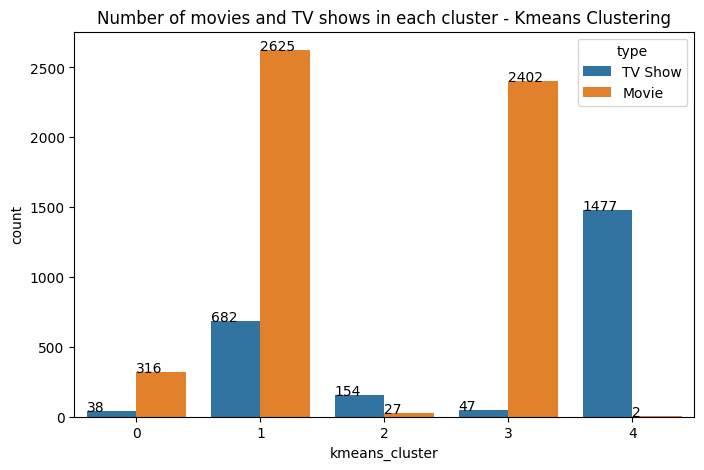

In [ ]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(8,5))
graph = sns.countplot(x='kmeans_cluster',data=df, hue='type')
plt.title('Number of movies and TV shows in each cluster - Kmeans Clustering')

# adding value count on the top of bar
for p in graph.patches:
   graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))

Successfully built 5 clusters using the k-means clustering algorithm.

### **Building wordclouds for different clusters in K-Means Clustering**



In [ ]:
def kmeans_worldcloud(cluster_number, column_name):

  '''function for Building a wordcloud for the movie/shows'''

  df_wordcloud = df[['kmeans_cluster',column_name]].dropna()
  df_wordcloud = df_wordcloud[df_wordcloud['kmeans_cluster']==cluster_number]

  # text documents
  text = " ".join(word for word in df_wordcloud[column_name])

  # create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)

  # Generate a word cloud image
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

**Word Cloud on "description" column for different cluster**

cluster 0


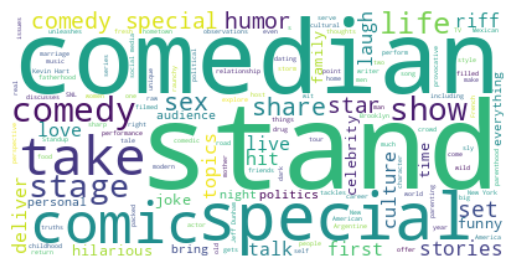

cluster 1


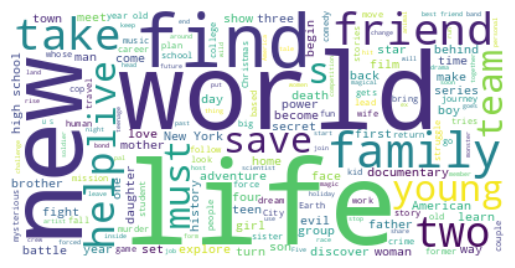

cluster 2


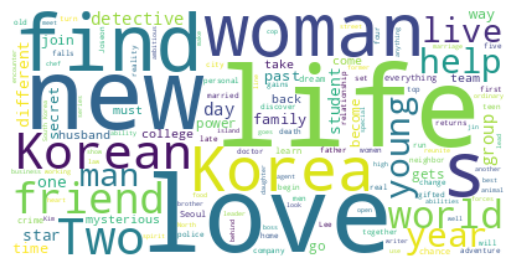

cluster 3


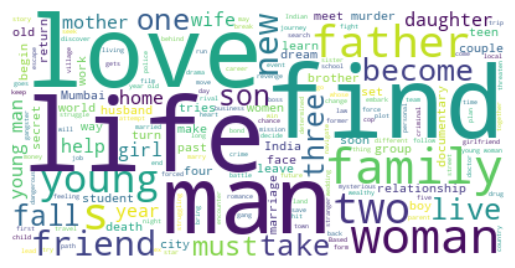

cluster 4


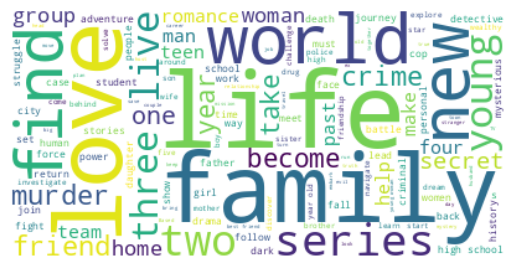

In [ ]:
for i in range(5):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'description')

cluster 0


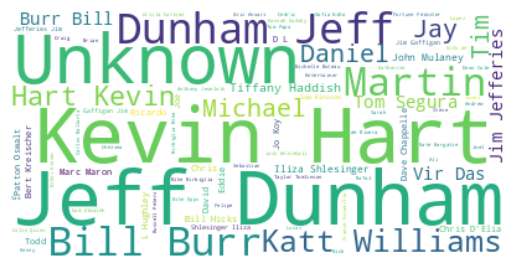

cluster 1


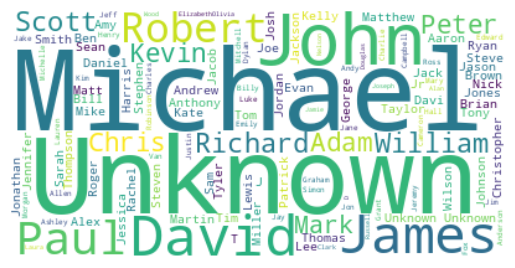

cluster 2


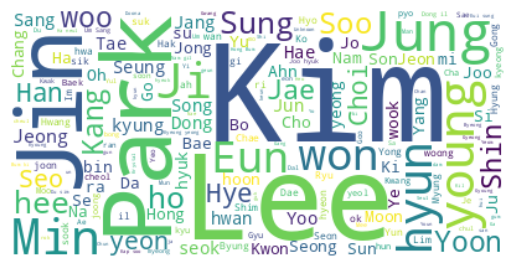

cluster 3


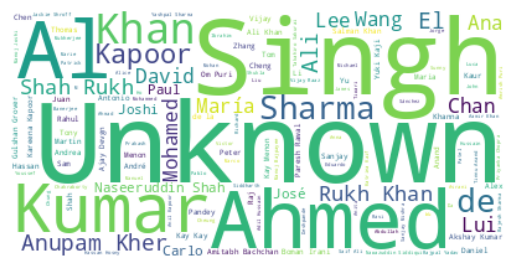

cluster 4


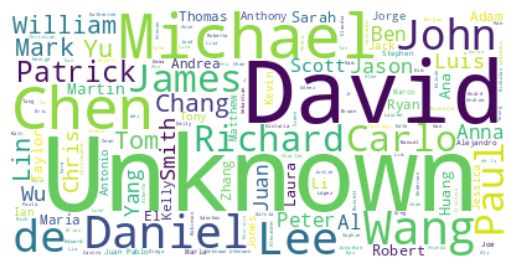

In [ ]:
for i in range(5):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'cast')

cluster 0


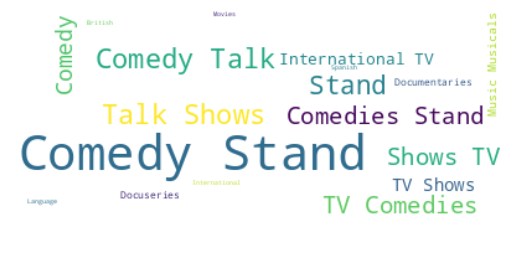

cluster 1


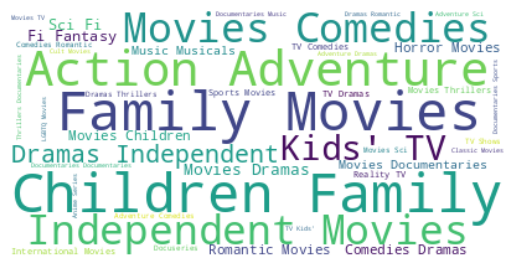

cluster 2


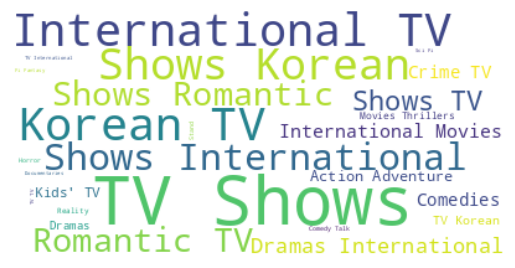

cluster 3


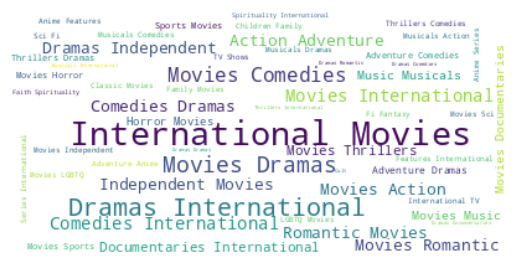

cluster 4


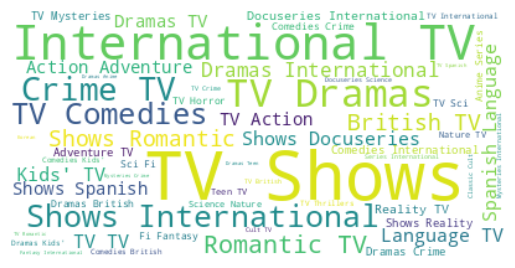

In [ ]:
for i in range(5):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'listed_in')

cluster 0


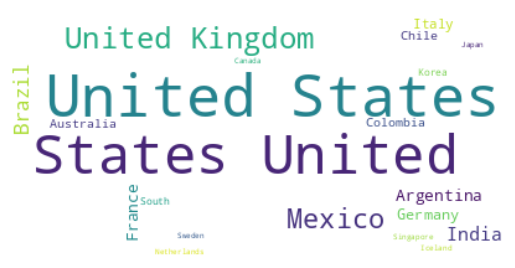

cluster 1


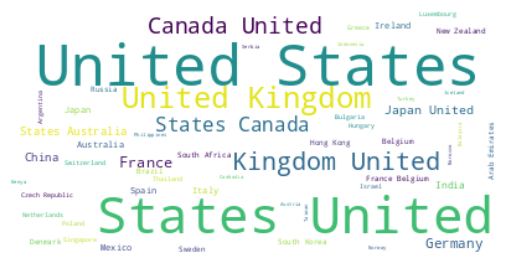

cluster 2


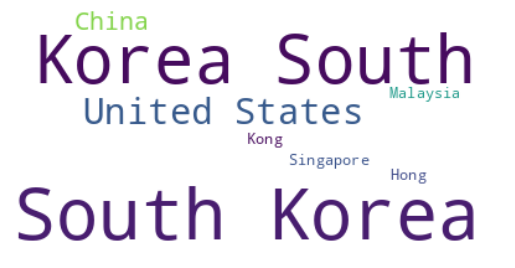

cluster 3


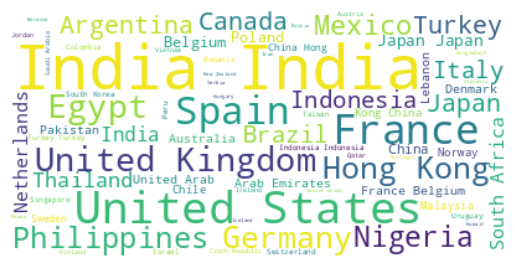

cluster 4


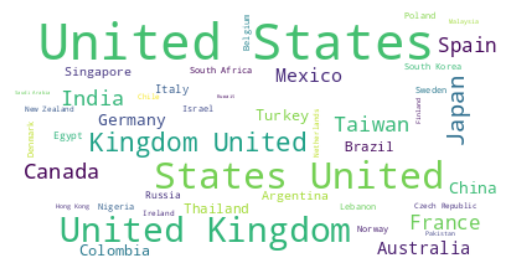

In [ ]:
for i in range(5):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'country')

cluster 0


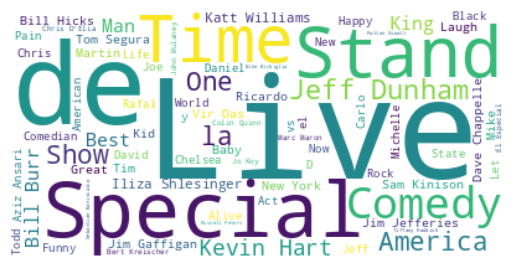

cluster 1


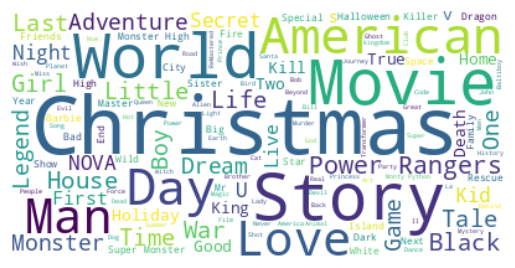

cluster 2


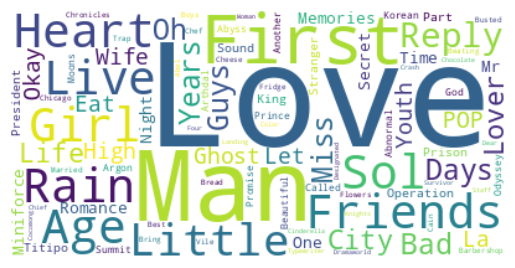

cluster 3


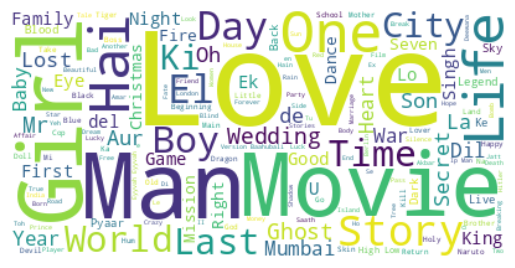

cluster 4


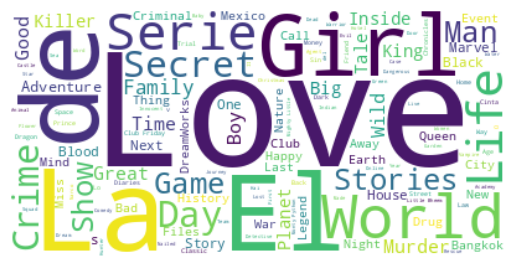

In [ ]:
for i in range(5):
  print(f'cluster {i}')
  kmeans_worldcloud(i,'title')

### Clusters Model - 2 Hierarchical clustering

After applying the agglomerative hierarchical clustering algorithm, the resulting clusters are displayed in a dendrogram, which is a tree-like structure. The dendrogram shows the relationships between the clusters at each level of the hierarchy.

To determine the optimal number of clusters for our data, we can visually inspect the dendrogram and look for the largest vertical distance that does not intersect any horizontal line. This distance represents the largest distance between any two merged clusters, and thus the point at which the clusters are most dissimilar.

We can then draw a horizontal line at this distance and count the number of vertical lines it intersects. This number corresponds to the optimal number of clusters for our data.

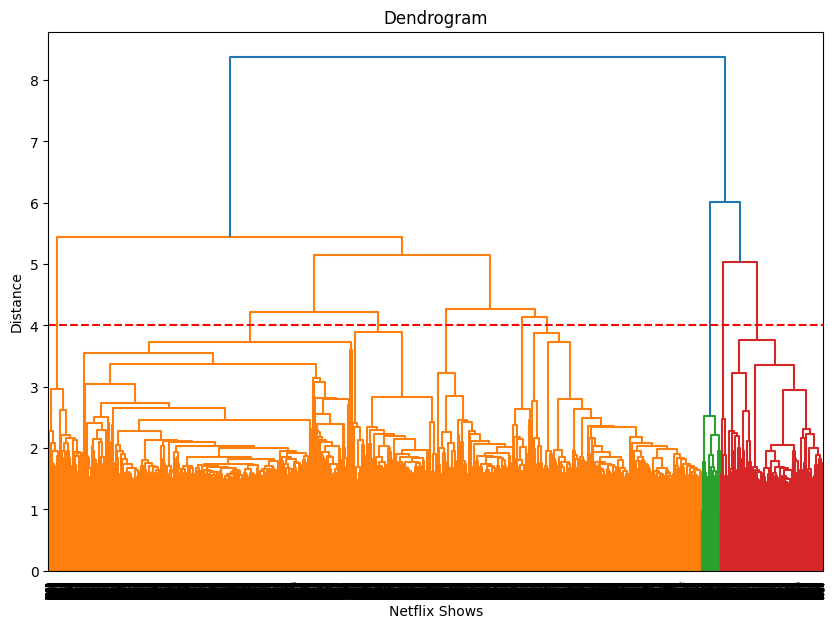

In [ ]:
# Building a dendogram to decide the number of clusters
plt.figure(figsize=(10, 7))
dend = shc.dendrogram(shc.linkage(X, method='ward'))
plt.title('Dendrogram')
plt.xlabel('Netflix Shows')
plt.ylabel('Distance')
plt.axhline(y= 4, color='r', linestyle='--')

**At a distance of 4 units, 7 clusters can be built using the agglomerative clustering algorithm.**

Building 7 clusters using the Agglomerative clustering algorithm:

In [ ]:
# Fitting hierarchical clustering model
hierarchical = AgglomerativeClustering(n_clusters=7, affinity='euclidean', linkage='ward')
hierarchical.fit_predict(X)

array([0, 0, 1, ..., 0, 4, 0])

In [ ]:
# Adding a hierarchical cluster number attribute
df['hierarchical_cluster'] = hierarchical.labels_

In [ ]:
df.sample(5)[['type', 'title', 'cast', 'country', 'rating', 'listed_in', 'description', 'hierarchical_cluster']]

,type,title,cast,country,rating,listed_in,description,hierarchical_cluster
263,Movie,Aşk Tesadüfleri Sever,"Mehmet Günsür, Belçim Bilgin, Ayda Aksel, Alta...",Turkey,Adult Content,"Dramas, International Movies, Romantic Movies",A series of coincidences brings two star-cross...,1
4636,Movie,One 2 Ka 4,"Shah Rukh Khan, Juhi Chawla, Jackie Shroff, Ni...",India,Teen Content,"Action & Adventure, Comedies, Dramas","When his partner is killed, a young cop is for...",2
3403,TV Show,Kingdoms of the Sky,Unknown,United States,Children Content,"British TV Shows, Docuseries, Science & Nature TV",Meet the astonishing animals and adventurous p...,5
5783,Movie,Standoff,"Thomas Jane, Laurence Fishburne, Joanna Dougla...",Canada,Adult Content,Action & Adventure,"After witnessing an assassin's slaughter, a yo...",0
7277,Movie,Twice,Stuart Varnam-Atkin,"Japan, United States",Teen Content,"Documentaries, International Movies",This documentary reenacts the experiences of l...,0


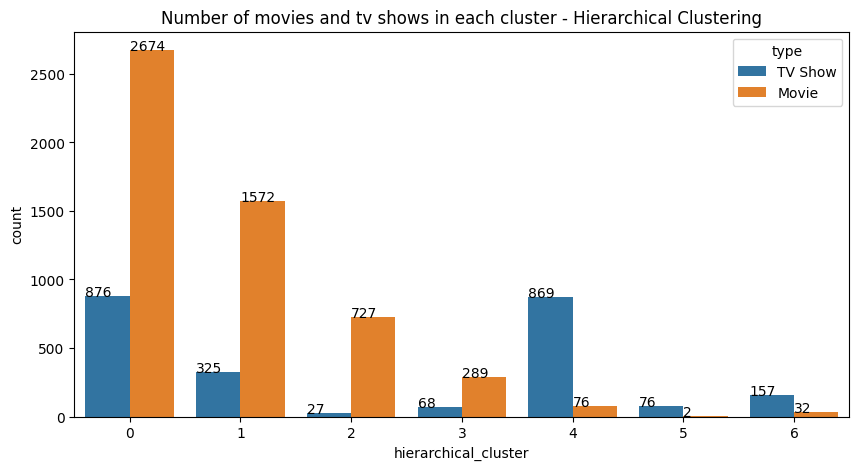

In [ ]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(10,5))
graph = sns.countplot(x='hierarchical_cluster',data=df, hue='type')
plt.title('Number of movies and tv shows in each cluster - Hierarchical Clustering')

# adding value count on the top of bar
for p in graph.patches:
   graph.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))

Successfully built 7 clusters using the Agglomerative (hierarchical) clustering algorithm.



In [ ]:
def hierarchical_worldcloud(cluster_number, column_name):

  '''function for Building a wordcloud for the movie/shows'''

  df_wordcloud = df[['hierarchical_cluster',column_name]].dropna()
  df_wordcloud = df_wordcloud[df_wordcloud['hierarchical_cluster']==cluster_number]

  # text documents
  text = " ".join(word for word in df_wordcloud[column_name])

  # create the word cloud
  wordcloud = WordCloud(stopwords=set(STOPWORDS), background_color="white").generate(text)

  # Generate a word cloud image
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

cluster 0


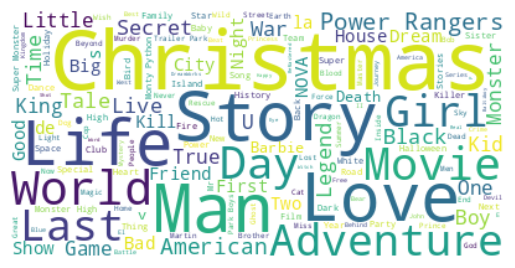

cluster 1


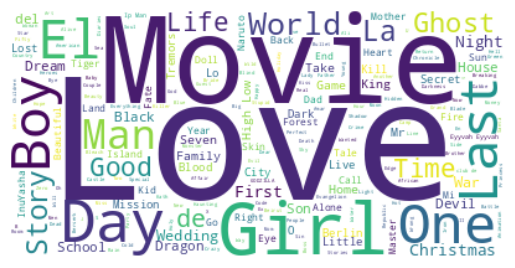

cluster 2


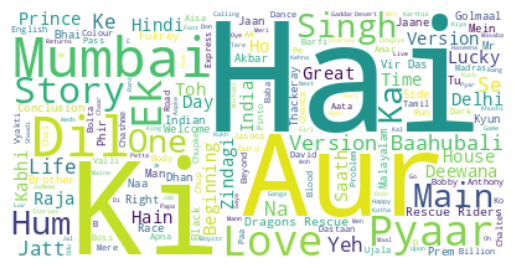

cluster 3


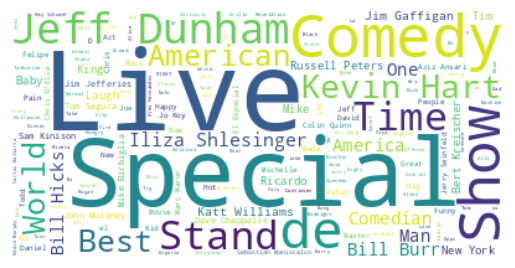

cluster 4


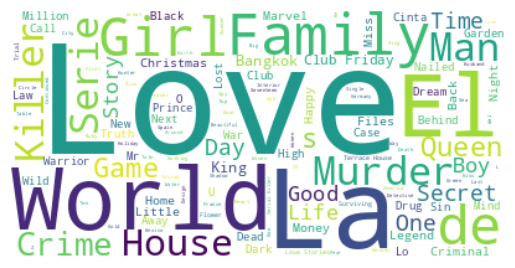

cluster 5


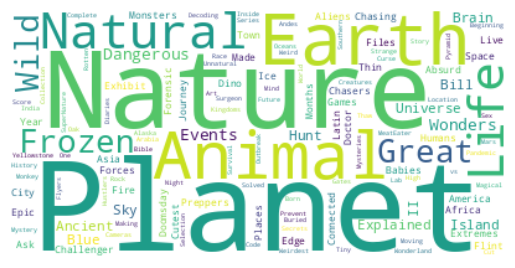

cluster 6


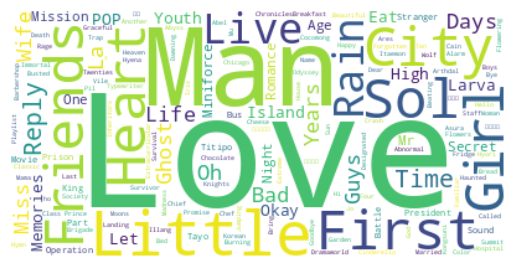

In [ ]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'title')

cluster 0


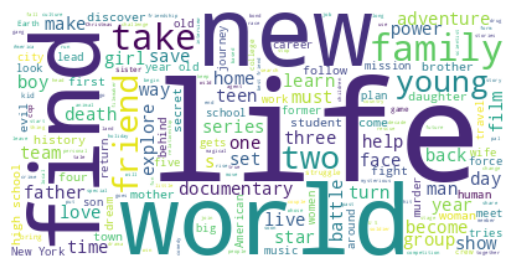

cluster 1


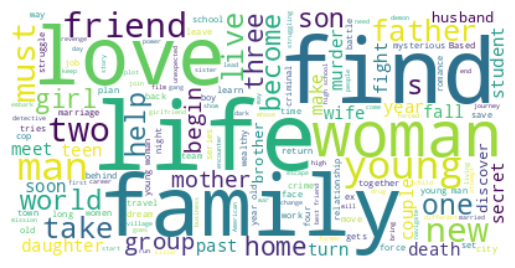

cluster 2


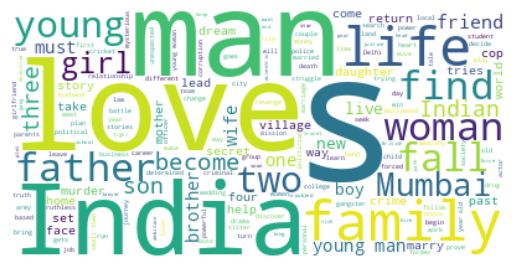

cluster 3


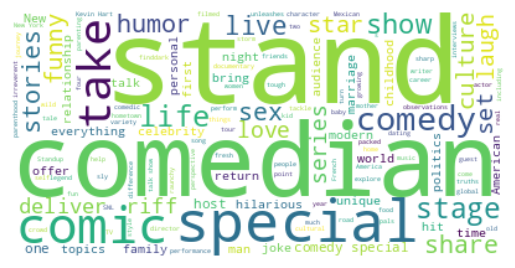

cluster 4


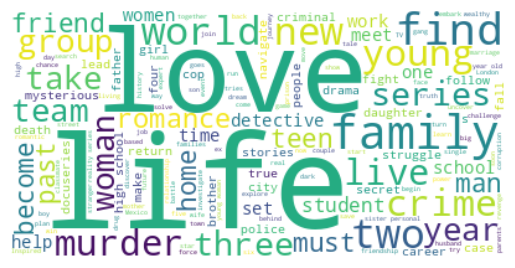

cluster 5


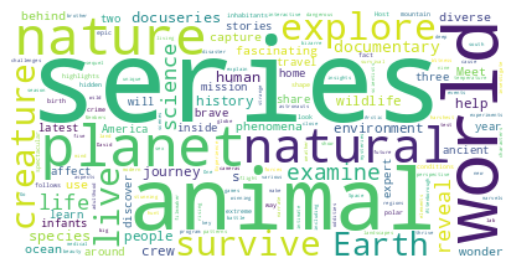

cluster 6


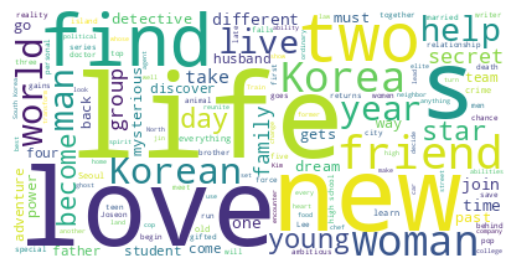

In [ ]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'description')

cluster 0


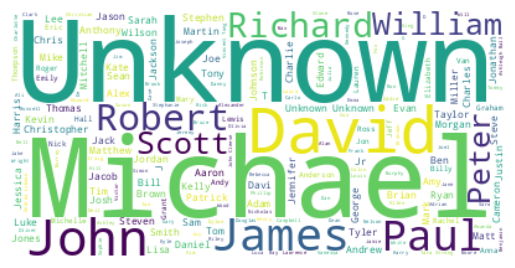

cluster 1


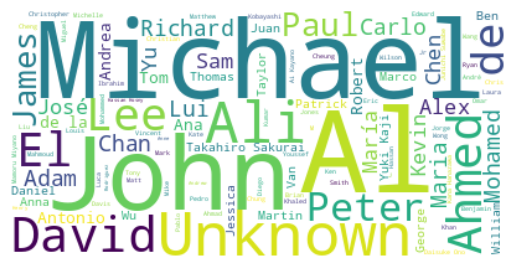

cluster 2


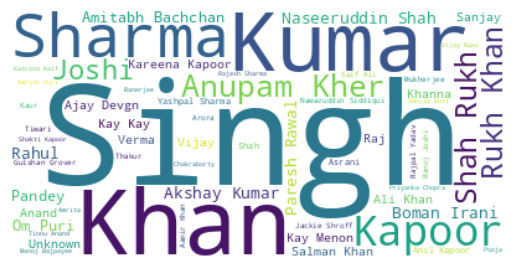

cluster 3


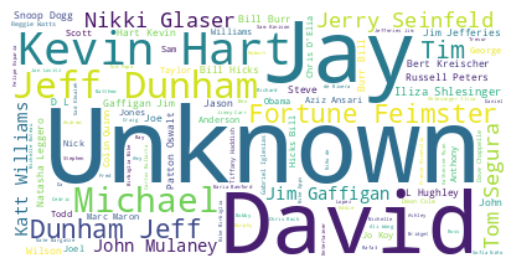

cluster 4


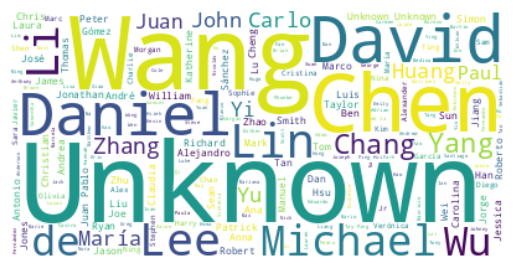

cluster 5


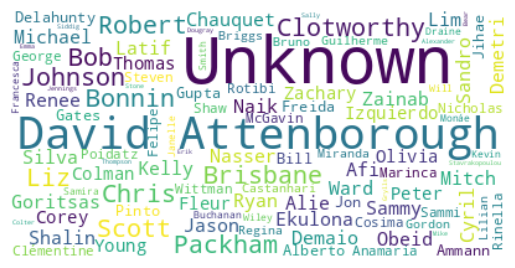

cluster 6


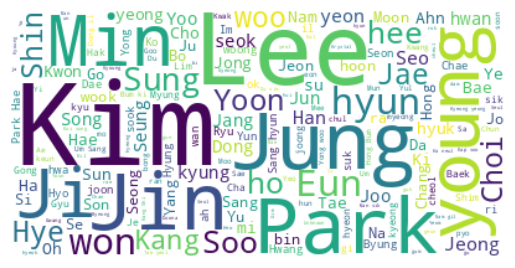

In [ ]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'cast')

cluster 0


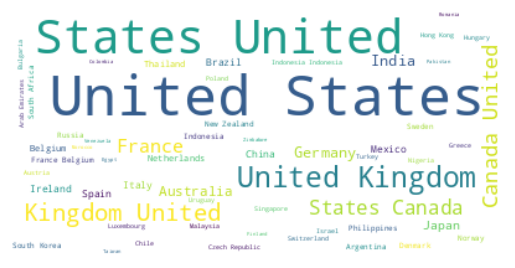

cluster 1


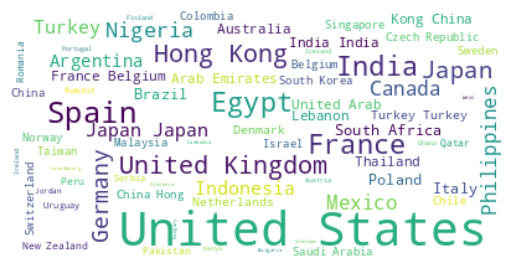

cluster 2


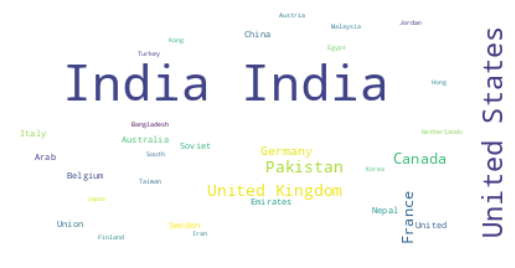

cluster 3


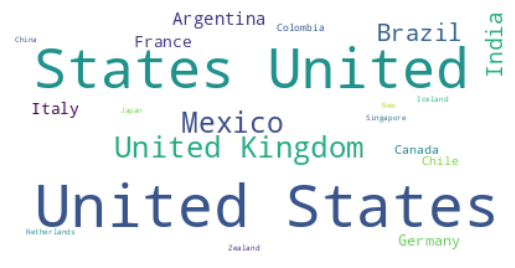

cluster 4


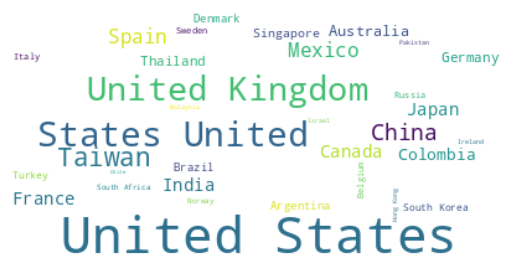

cluster 5


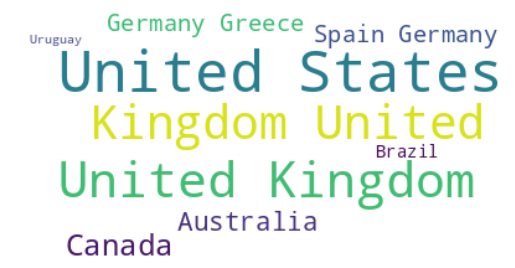

cluster 6


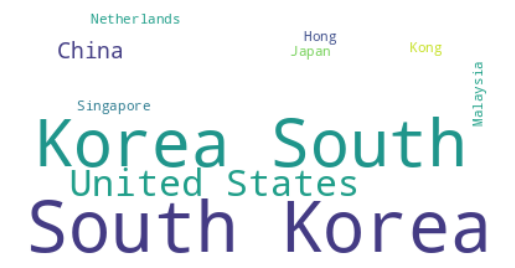

In [ ]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'country')

cluster 0


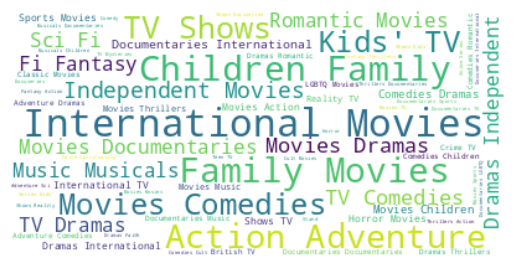

cluster 1


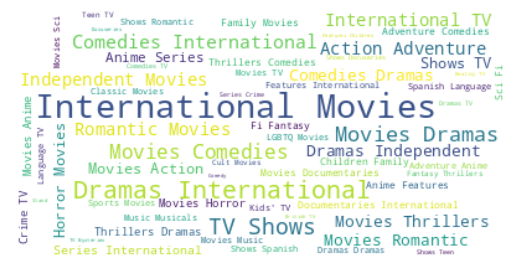

cluster 2


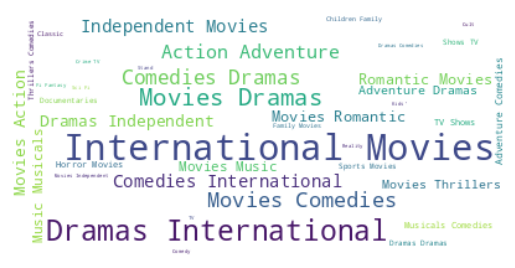

cluster 3


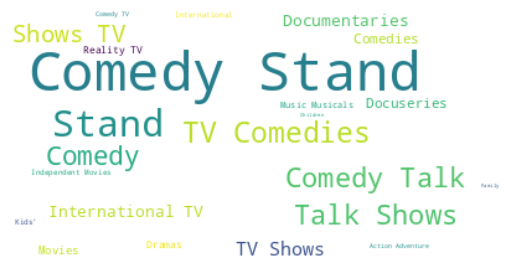

cluster 4


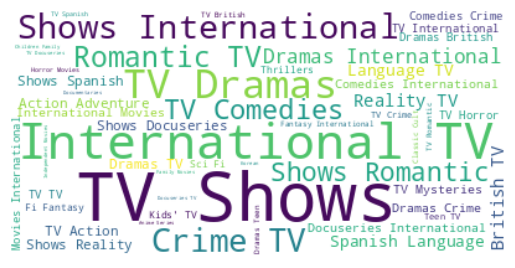

cluster 5


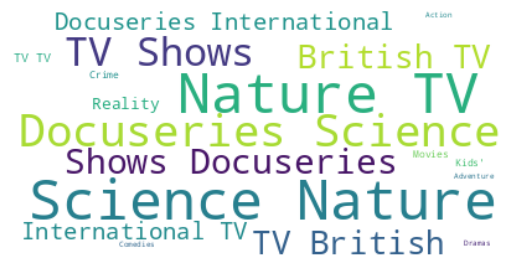

cluster 6


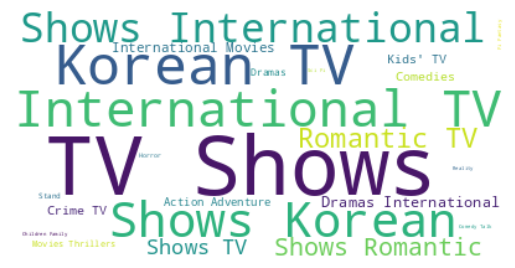

In [ ]:
for i in range(7):
  print(f'cluster {i}')
  hierarchical_worldcloud(i,'listed_in')

## Recommender System

In [ ]:
# defining new dataframe for building recommandation system
recommender_df = df.copy()

# reseting index
recommender_df.reset_index(inplace=True)

# checking whether or not reset index properly
recommender_df[['show_id', 'title', 'tags']]

,show_id,title,tags
0,s1,3%,futur elit inhabit island paradis far crowd sl...
1,s2,7:19,devast earthquak hit mexico citi trap survivor...
2,s3,23:59,armi recruit found dead fellow soldier forc co...
3,s4,9,postapocalypt world ragdol robot hide fear dan...
4,s5,21,brilliant group student becom cardcount expert...
...,...,...,...
7765,s7783,Zozo,lebanon civil war depriv zozo famili hes left ...
7766,s7784,Zubaan,scrappi poor boy worm way tycoon dysfunct fami...
7767,s7785,Zulu Man in Japan,documentari south african rapper nasti c hit s...
7768,s7786,Zumbo's Just Desserts,dessert wizard adriano zumbo look next “willi ...


As you can see above dataframe We successfully reset the index. Now dataset is ready to build content based recommandation system

In [ ]:
# dropping show-id and index column
recommender_df.drop(columns=['index', 'show_id'], inplace=True)


print(f"before reset index id for movie 'Zero' : {df[df['title'] == 'Zero'].index[0]}")  # index[0] --> to locate index position
print(f"after reset index id for movie 'Zero': {recommender_df[recommender_df['title'] == 'Zero'].index[0]}")

before reset index id for movie 'Zero' : 7764
after reset index id for movie 'Zero': 7747


In [ ]:
# calling out transformed array independent features created from tags(cluster) column after performing PCA for dimenssionality reduction.
X

array([[ 1.60630808e-01, -8.52066094e-03, -2.59942783e-02, ...,
         6.09111558e-03, -1.57436937e-02, -1.64369856e-03],
       [-4.83795907e-02, -2.86336681e-02,  1.25761169e-02, ...,
        -7.10278931e-04,  9.69816755e-03, -1.29615630e-02],
       [-4.44147521e-02, -5.70456187e-02, -3.50845700e-02, ...,
         9.82554051e-03,  4.36724833e-04, -4.11352281e-03],
       ...,
       [-7.49427548e-02,  2.49390132e-02,  9.39044679e-02, ...,
         1.76240069e-02,  1.05817263e-02,  9.63621900e-03],
       [ 6.59947673e-02,  5.09387352e-02,  5.23214985e-02, ...,
         1.60963418e-02,  1.50471608e-02,  3.41015217e-03],
       [-6.75308452e-02,  2.00151776e-01,  2.15505678e-01, ...,
        -1.56189858e-04, -1.69755841e-02, -2.52129641e-03]])

In [ ]:
# calculate cosine similarity
similarity = cosine_similarity(X)
similarity

array([[ 1.        ,  0.04125331,  0.02235563, ..., -0.02250696,
         0.01016848, -0.02082098],
       [ 0.04125331,  1.        ,  0.00323192, ...,  0.07448814,
        -0.0068202 , -0.01595348],
       [ 0.02235563,  0.00323192,  1.        , ..., -0.00161926,
        -0.0101119 , -0.01692032],
       ...,
       [-0.02250696,  0.07448814, -0.00161926, ...,  1.        ,
        -0.01174126,  0.12747673],
       [ 0.01016848, -0.0068202 , -0.0101119 , ..., -0.01174126,
         1.        ,  0.04318931],
       [-0.02082098, -0.01595348, -0.01692032, ...,  0.12747673,
         0.04318931,  1.        ]])

**Function for list down top 10 recommended movie on the basis of cosine similarity score**

In [ ]:
def recommend(movie):
    '''
    This function list down top ten movies on the basis of similarity score for that perticular movie.
    '''
    print(f"If you liked '{movie}', you may also enjoy: \n")

    # find out index position
    index = recommender_df[recommender_df['title'] == movie].index[0]

    # sorting on the basis of simliarity score, In order to find out distaces from recommended one
    distances = sorted(list(enumerate(similarity[index])), reverse=True, key=lambda x:x[1])

    # listing top ten recommenaded movie
    for i in distances[1:11]:
        print(df.iloc[i[0]].title)

In [ ]:
recommend('Naruto')

If you liked 'Naruto', you may also enjoy: 

Nailed It! Mexico
Naked
Nails
Namak Halaal
Nailed It! Spain
Namastey London
Naledi: A Baby Elephant's Tale
DreamWorks Spooky Stories
BLAME!
Blazing Transfer Students


In [ ]:
recommend('3 Idiots')

If you liked '3 Idiots', you may also enjoy: 

Pihu
Rake
Ek Jaan Hain Hum
For Colored Girls
Dolphin Kick
Mac & Devin Go to High School
Digs & Discoveries: All Track's Lead to Rome
Colin Quinn: Unconstitutional
System Crasher
Dieter Nuhr: Nuhr in Berlin


# **Conclusion**

Our goal was to cluster the shows into groups based on their similarities and differences, ultimately creating a content-based recommender system that suggests 10 shows based on the user's viewing history.

With over 7787 records and 11 attributes, we began our adventure by delving into the dataset's missing values and performing exploratory data analysis (EDA). Our findings revealed that Netflix boasts more movies than TV shows, with a rapidly growing collection of shows from the United States.

To cluster the shows, we focused on six key attributes: director, cast, country, genre, rating, and description. We transformed these attributes into a 10000-feature TFIDF vectorization, then used Principal Component Analysis (PCA) to tackle the curse of dimensionality. By reducing the components to 3000, we were able to capture more than 80% of the variance.

Next, we used two clustering algorithms, K-Means and Agglomerative clustering, to group the shows. K-Means determined that the optimal number of clusters was 5, as confirmed by the elbow method and Silhouette score analysis. Meanwhile, Agglomerative clustering suggested 7 clusters, which we visualized using a dendrogram.

But we didn't stop there. We then created a content-based recommender system using the similarity matrix obtained through cosine similarity. This system provides personalized recommendations based on the type of show the user has watched, giving them 10 top-notch suggestions to explore.

### ***Thankyou.***